In [1]:
import numpy as np
from sklearn.cluster import KMeans
from skimage.io import imread, imsave

In [2]:
import PIL.Image

In [11]:
imread('mem.png').shape

(451, 640, 3)

(Тут система RGB, поэтому третье измерение = 3)

Код для уменьшения числа цветов в картинке  
источник: https://muthu.co/reduce-the-number-of-colors-of-an-image-using-k-means-clustering/ 


In [3]:
n_colors = 40

sample_img = imread('mem.png')
w,h,_ = sample_img.shape
sample_img = sample_img.reshape(w*h,3)
kmeans = KMeans(n_clusters=n_colors, random_state=0).fit(sample_img)

# the cluster centroids is our color palette
identified_palette = np.array(kmeans.cluster_centers_).astype(int)

'''# find out which cluster each pixel belongs to.
labels = kmeans.predict(sample_img)

# recolor the entire image
recolored_img = np.copy(sample_img)
for index in range(len(recolored_img)):
    recolored_img[index] = identified_palette[labels[index]]
    
# reshape for display
recolored_img = recolored_img.reshape(w,h,3)

imsave('kmeans_color_q40.jpg', recolored_img)'''

"# find out which cluster each pixel belongs to.\nlabels = kmeans.predict(sample_img)\n\n# recolor the entire image\nrecolored_img = np.copy(sample_img)\nfor index in range(len(recolored_img)):\n    recolored_img[index] = identified_palette[labels[index]]\n    \n# reshape for display\nrecolored_img = recolored_img.reshape(w,h,3)\n\nimsave('kmeans_color_q40.jpg', recolored_img)"

In [17]:
identified_palette

array([[254, 254, 254],
       [  3, 250, 144],
       [254, 144,   1],
       [168,  56, 254],
       [  6,  53, 255],
       [ 50, 249,   0],
       [254,  40,   1],
       [232,  48, 181],
       [  1, 245, 250],
       [221, 250,   0],
       [155, 250,   1],
       [245,  62, 249],
       [  0, 166, 254],
       [230,  38, 107],
       [  2, 249,  70],
       [ 49,  51, 254],
       [  0,  90, 255],
       [254,  75,   0],
       [254, 210,   0],
       [120, 249,   0],
       [  1, 251, 218],
       [246,  36,  35],
       [  6, 249,  36],
       [ 90,  52, 254],
       [ 86, 249,   0],
       [189, 250,   0],
       [224,  45, 146],
       [  3, 250, 106],
       [ 13, 249,   4],
       [206,  59, 254],
       [  0, 127, 254],
       [242,  55, 215],
       [254, 177,   0],
       [  0, 205, 254],
       [242, 242, 242],
       [254, 110,   0],
       [251, 244,   0],
       [238,  36,  70],
       [130,  54, 254],
       [  4, 250, 182]])

Пример работы:

Неповторимый оригинал:
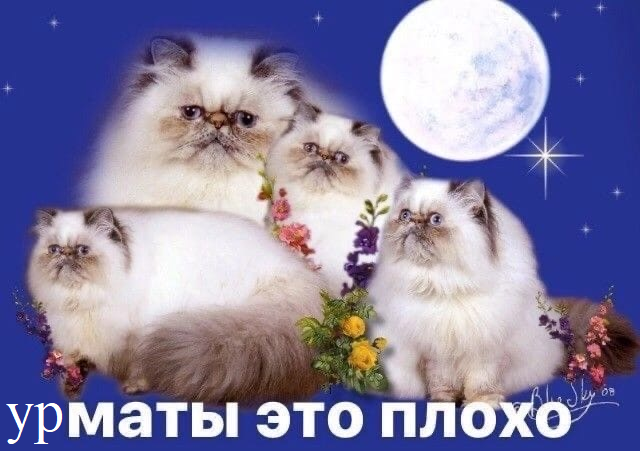

Жалкая пародия из 10 цветов:
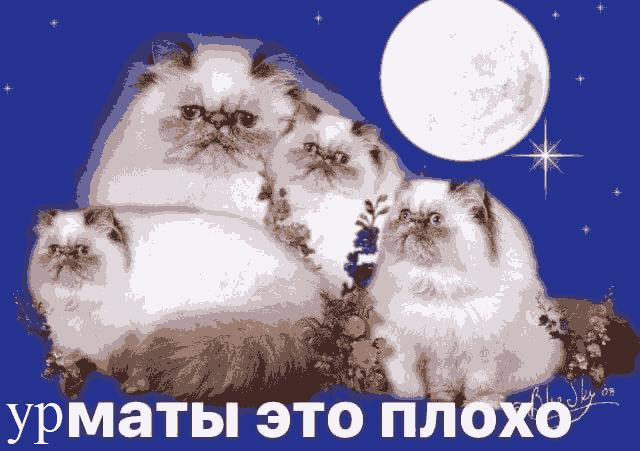

Чуть менее жалкая пародия из 40 цветов:
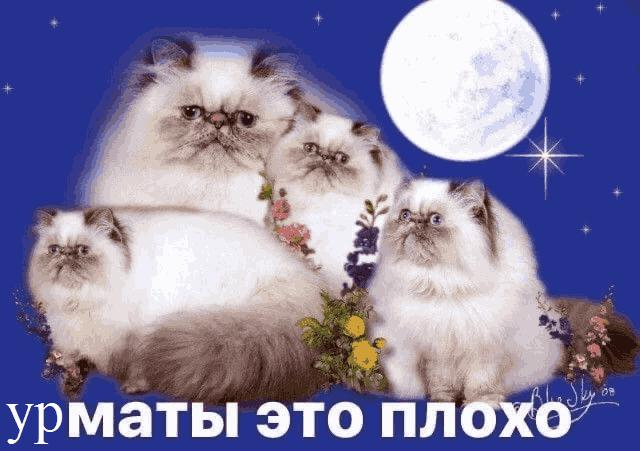

А теперь применим эту же палитру к другой картинке:

In [50]:
imread('палитра.png').shape

(900, 900, 4)

Тут система RGBA(alpha-прозрачность), поэтому 4 измерения

In [14]:
def my_read(name): #считывание картинки и приведение к RGB, если надо
    new_img = imread(name)
    w,h,c = new_img.shape
    if c==4:
        rgba_image = PIL.Image.open(name)
        rgb_img = rgba_image.convert('RGB')
        pix = np.array(rgb_img.getdata()).reshape(rgb_img.size[0], rgb_img.size[1], 3)
        return pix
    elif c==3:
        return new_img
    else:
        raise TypeError 

In [12]:
def my_filter(img, kmeans, to_name):
    identified_palette = np.array(kmeans.cluster_centers_).astype(int)
    
    w,h,_ = img.shape
    new_img = img.reshape(w*h,3)

    labels = kmeans.predict(new_img)
    
    recolored_img = np.copy(new_img)
    for index in range(len(recolored_img)):
        recolored_img[index] = identified_palette[labels[index]]

    # reshape for display
    recolored_img = recolored_img.reshape(w,h,3)

    imsave(to_name, recolored_img)

In [9]:
my_filter(my_read('палитра.png'), kmeans)

C:\Users\K\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: палитра40.jpg is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int32 to uint8. Range [13, 253]. Convert image to uint8 prior to saving to suppress this warning.


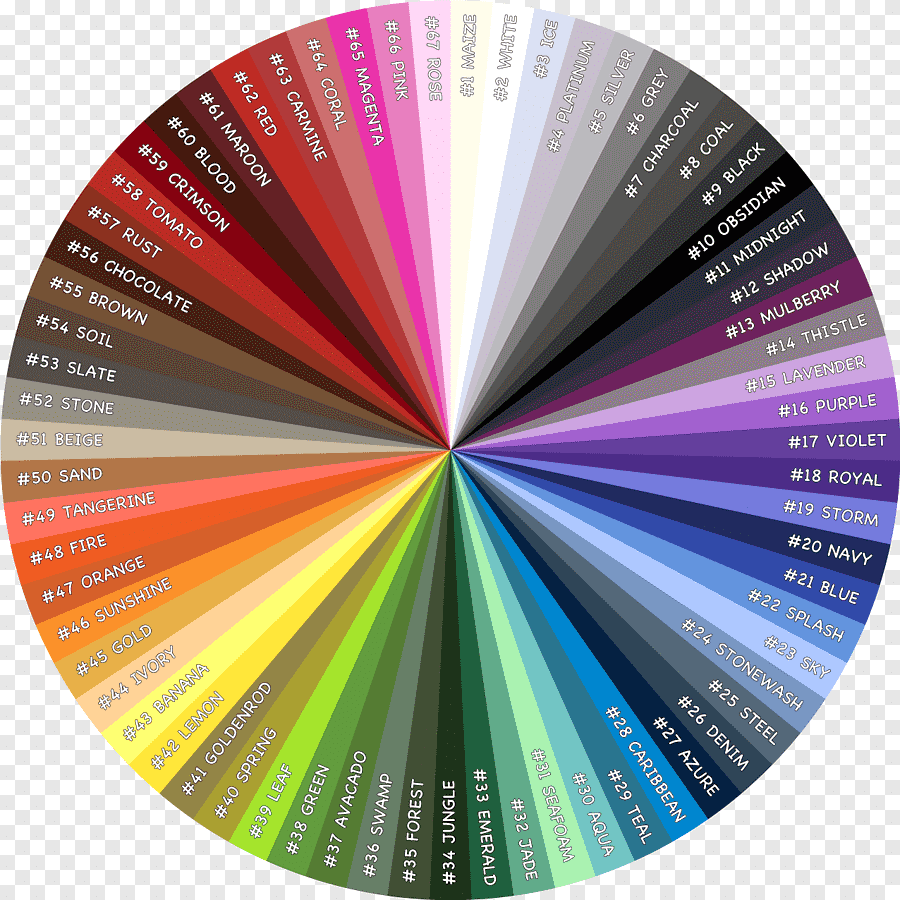


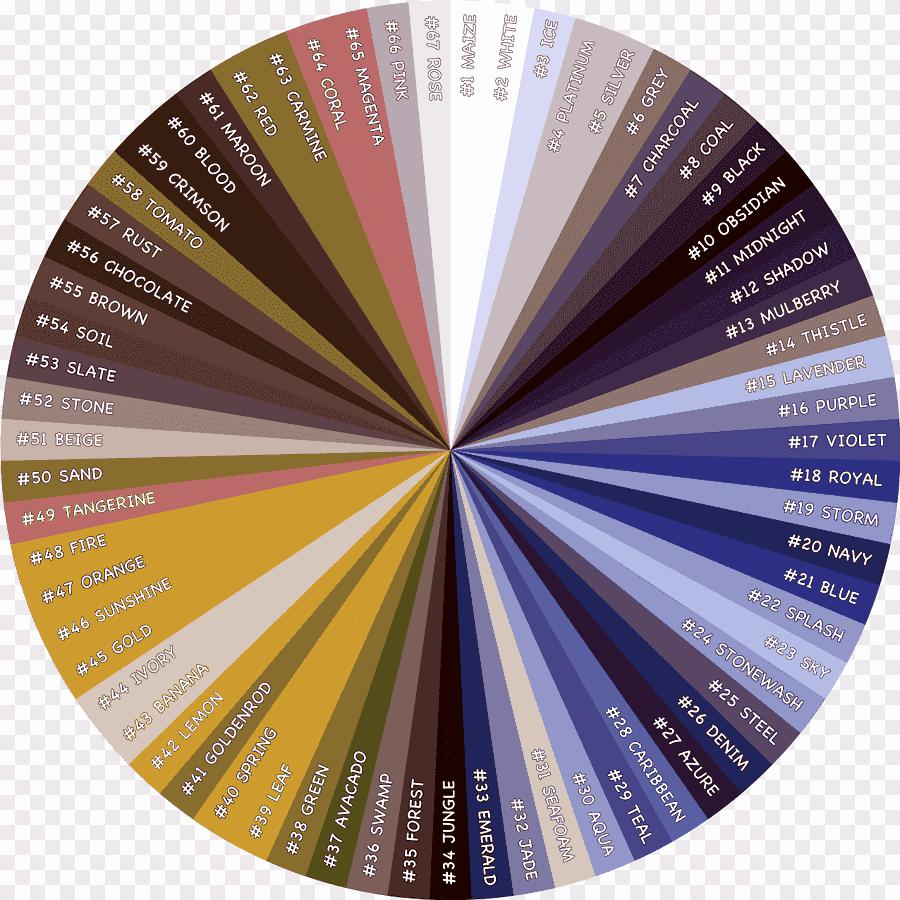

Как видим, фильтр фильтрует в своих цветах. А сейчас попробуем немного сломать мозг кластеризатору.

Будем обрабатывать это:
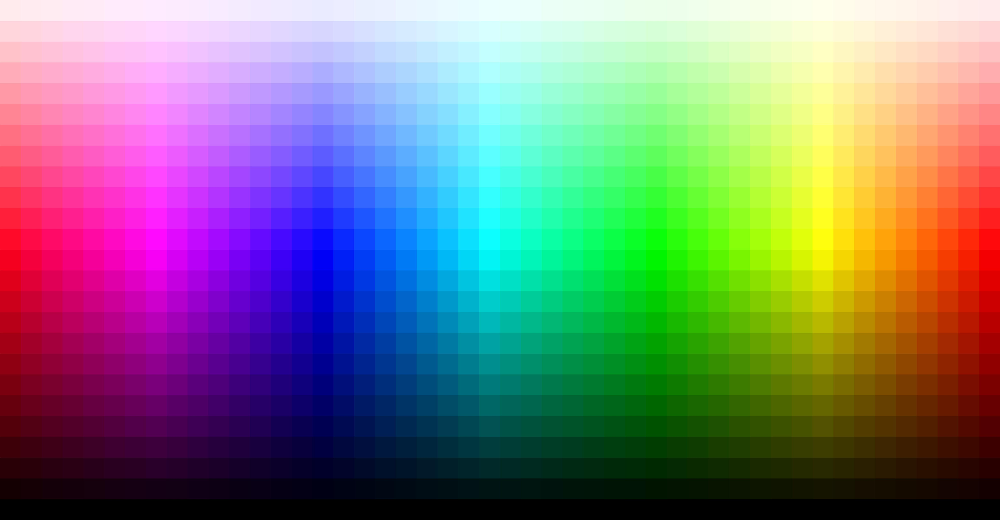

In [10]:
def my_model(n_colors, name):
    img = my_read(name)
    w,h,_ = img.shape
    img = img.reshape(w*h,3)
    
    kmeans = KMeans(n_clusters=n_colors, random_state=0).fit(img)
    # the cluster centroids is our color palette
    #identified_palette = np.array(kmeans.cluster_centers_).astype(int)
    return kmeans

In [11]:
n_colors = 40

kmeans1 = my_model(40, 'rgb.jpg')
# the cluster centroids is our color palette
identified_palette = np.array(kmeans1.cluster_centers_).astype(int)


MemoryError: 

Что ж, у нас получилось...

посчитано в колабе:
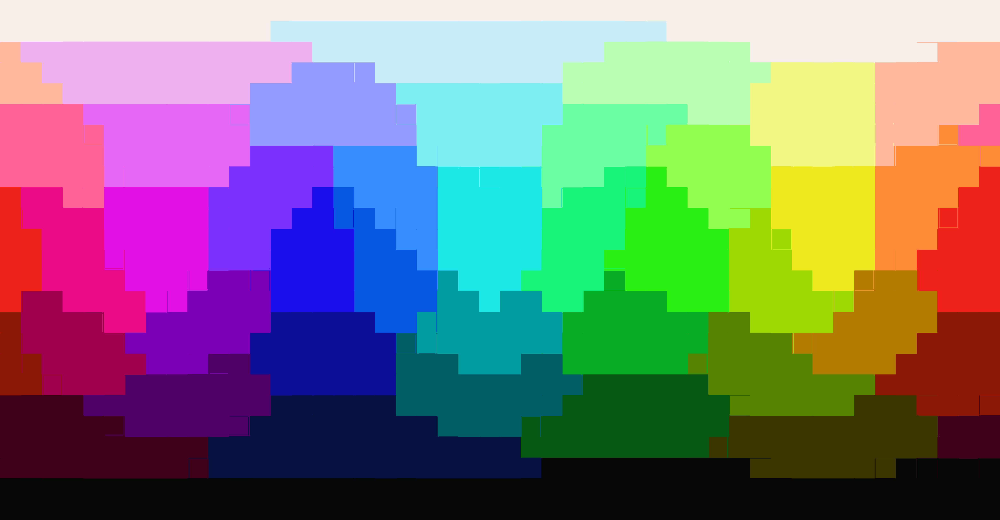

Еще одна картинка с непрерывной градацией цвета

In [15]:
n_colors = 40

kmeans1 = my_model(40, 'rgb.png')
# the cluster centroids is our color palette
identified_palette = np.array(kmeans1.cluster_centers_).astype(int)

In [16]:
my_filter(my_read('rgb.png'), kmeans1, 'rgb40.png')

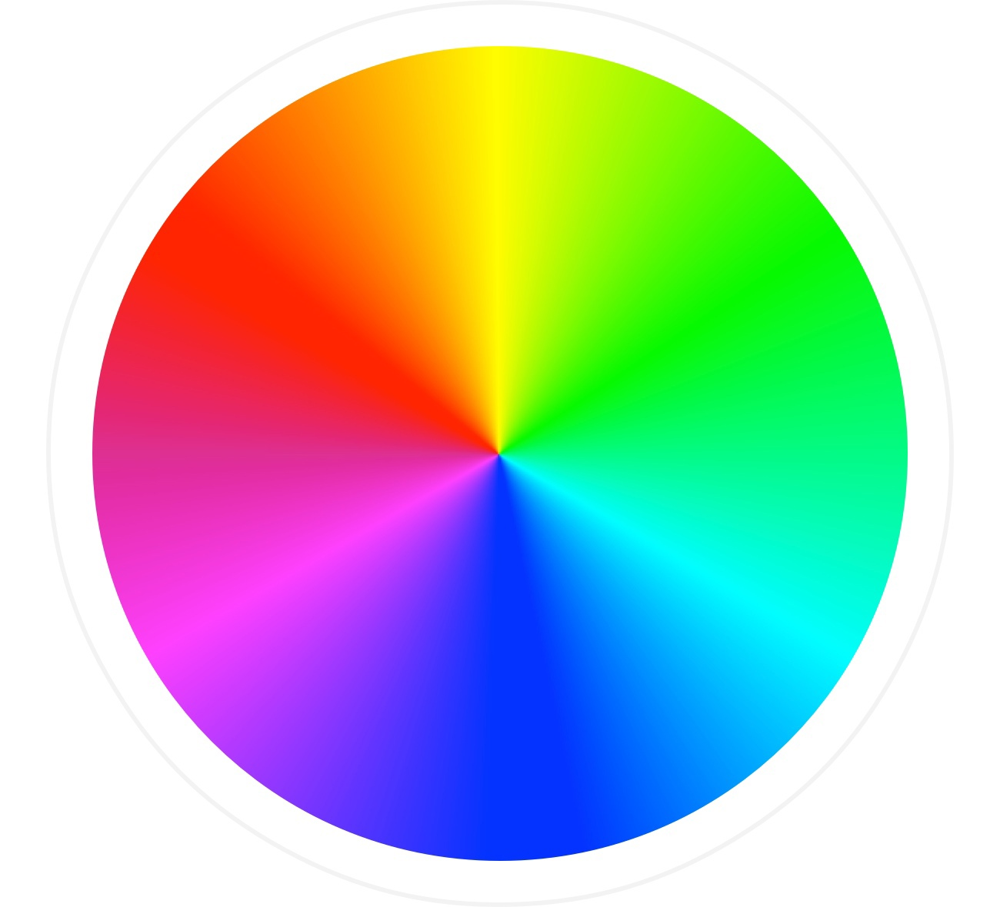
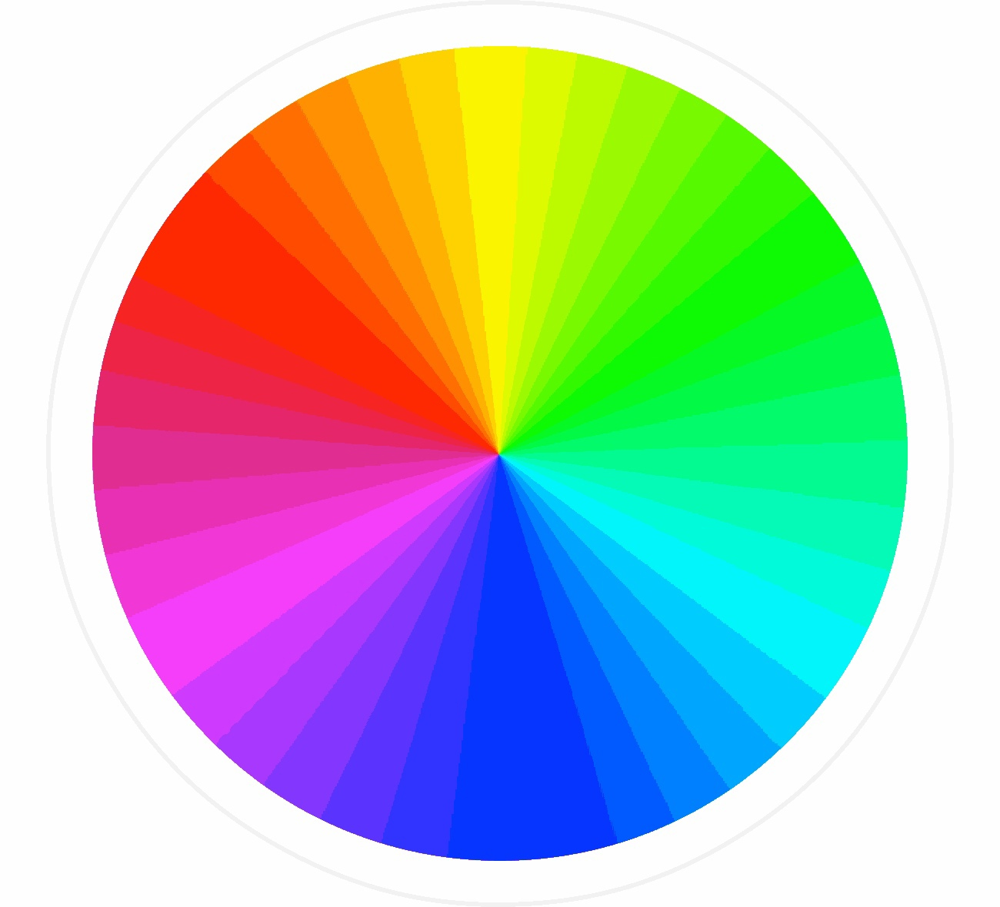

Кстати, я тут вижу 34 цвета)

Попробую составить фильтр под себя предварительно разделив весь спектр на 60 цветов

In [18]:
kmeans60 = my_model(60, 'rgb.png')
# the cluster centroids is our color palette
identified_palette = np.array(kmeans60.cluster_centers_).astype(int)

In [19]:
my_filter(my_read('rgb.png'), kmeans60, 'rgb60.png')

60 цветов:
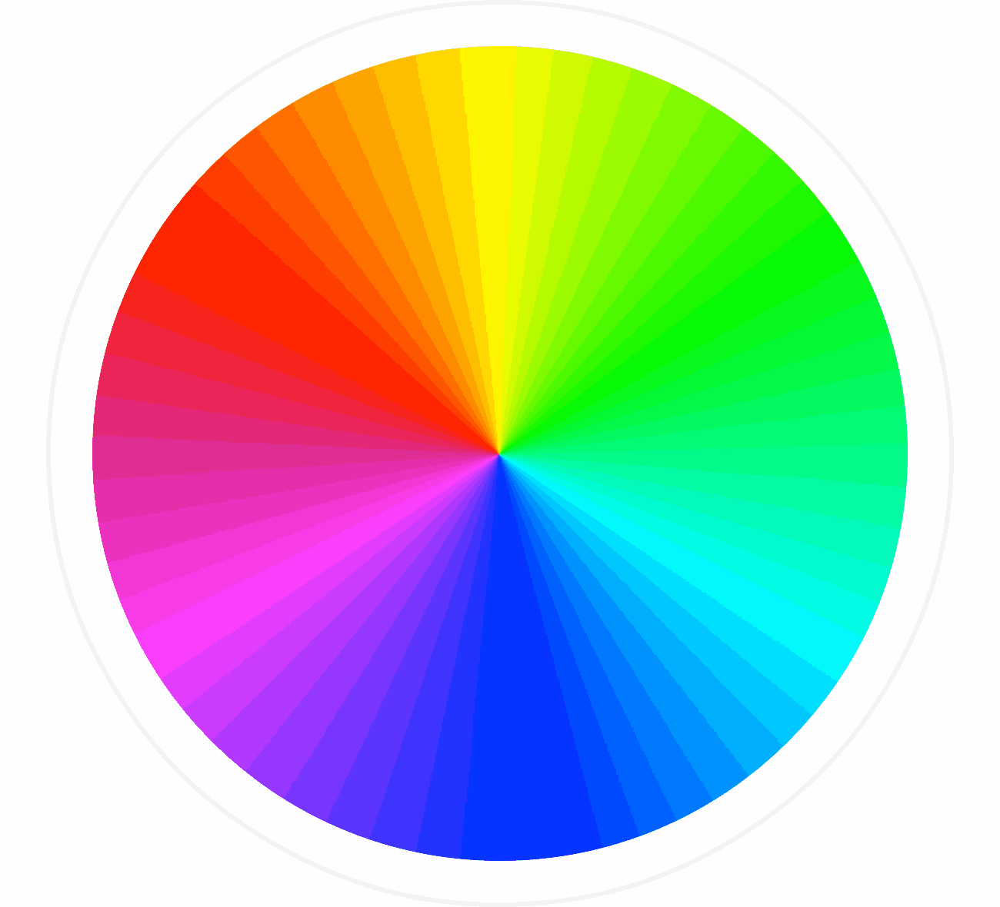

После обработки в paint.net. (Инструмент "волшебная палочка" с чувствительностью 0% выделяет кластер по цвету пикселя, а я меняю, если они одинаковы с соседом по-моему) + добавлены серый и чёрный. Всего 47 цветов.
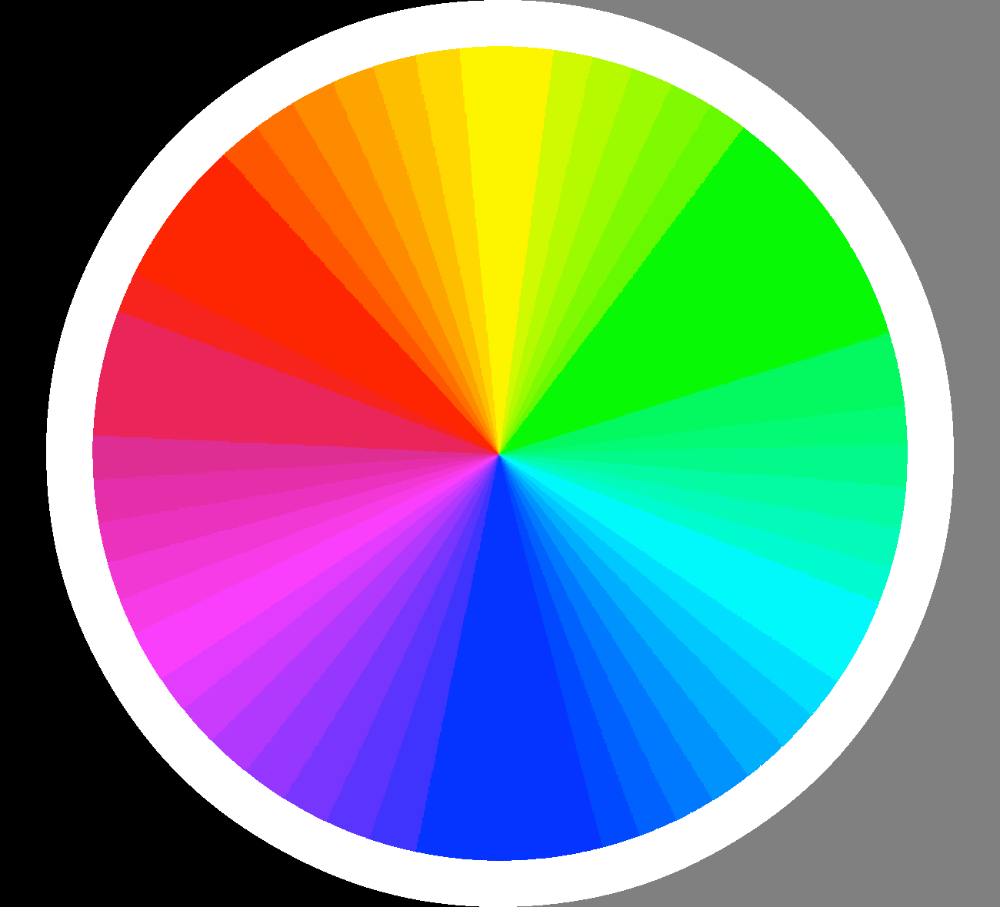

In [24]:
kmeans_my_wob = my_model(45, 'myrgb wo black.png')
# the cluster centroids is our color palette
identified_palette = np.array(kmeans_my.cluster_centers_).astype(int)

In [25]:
my_filter(my_read('myrgb wo black.png'), kmeans_my_wob, 'myrgb45.png')

C:\Users\K\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: myrgb45.png is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int32 to uint8. Range [0, 255]. Convert image to uint8 prior to saving to suppress this warning.


In [29]:
my_filter(my_read('палитра.png'), kmeans, 'палитра10.png')

C:\Users\K\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: палитра10.png is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int32 to uint8. Range [38, 248]. Convert image to uint8 prior to saving to suppress this warning.


In [31]:
my_filter(my_read('палитра.png'), kmeans_my_wob, 'палитра45моя.png')

C:\Users\K\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: палитра45моя.png is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int32 to uint8. Range [0, 255]. Convert image to uint8 prior to saving to suppress this warning.


Обучение без черного и серого дают сие:
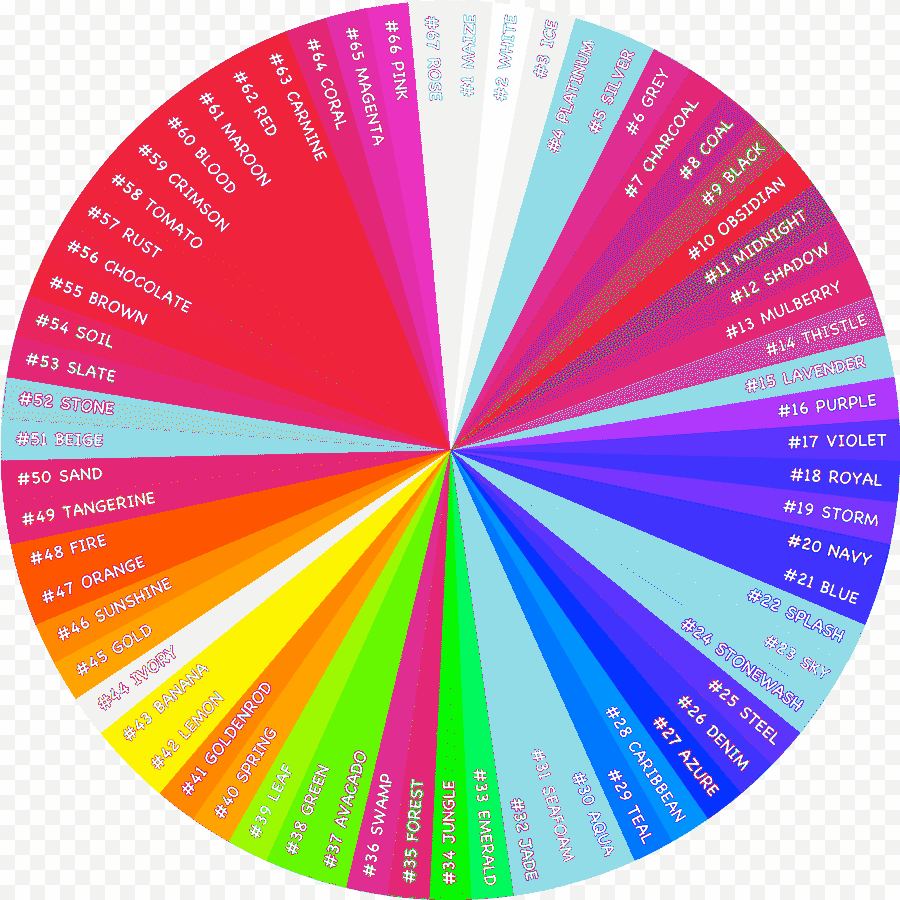

In [24]:
kmeans_my = my_model(47, 'myrgb.png')
# the cluster centroids is our color palette
identified_palette = np.array(kmeans_my.cluster_centers_).astype(int)

In [32]:
my_filter(my_read('палитра.png'), kmeans_my, 'палитра моя.png')

C:\Users\K\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: палитра моя.png is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int32 to uint8. Range [0, 254]. Convert image to uint8 prior to saving to suppress this warning.


Обучение с черным и серым сие:
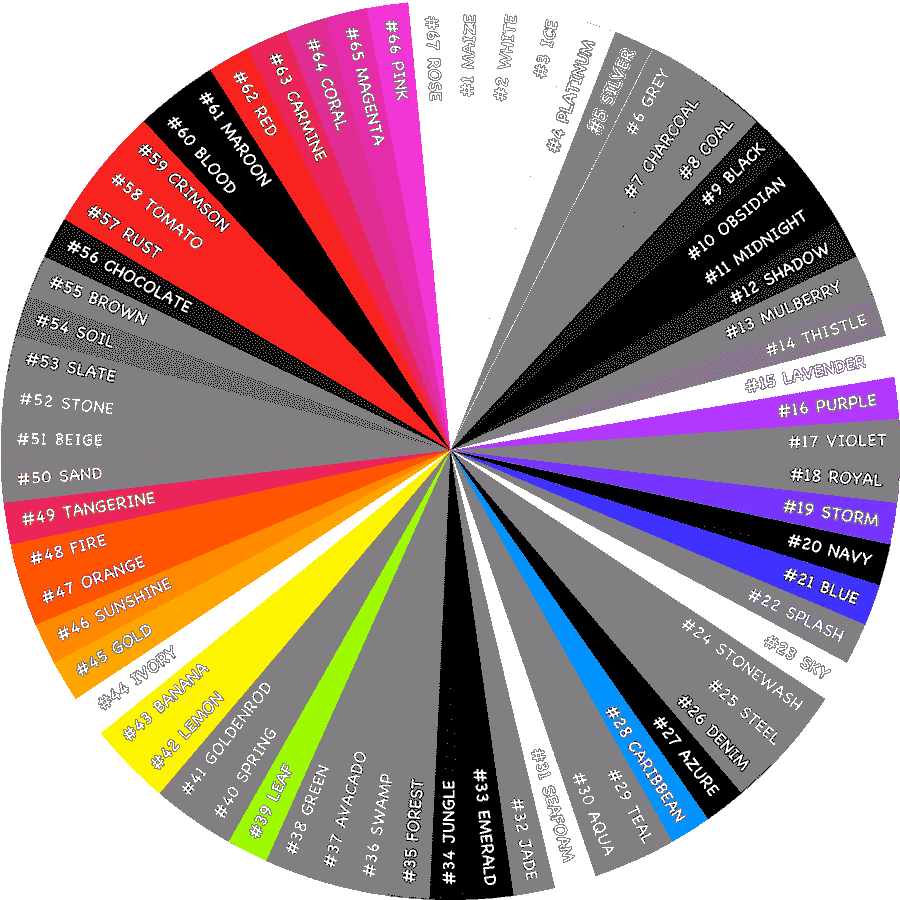

Если что, вижу я не так. Но в принципе понятно, почему это получилось: все цвета, на которой строилась модель "моего зрения" были очень яркими и не включали тёмных цветов вообще. Картинка, которую я пытаюсь конвертировать - наоборот. Вывод: надо обучаться на более широкой выборке, содержащей цвета всех яркостей. А пока что попробую подобрать картинку с яркой цветовой гаммой.

Ну и до кучи:

In [33]:
my_filter(my_read('mem.png'), kmeans_my, 'мем мой.png')

In [34]:
my_filter(my_read('mem.png'), kmeans_my_wob, 'мем мой wob.png')

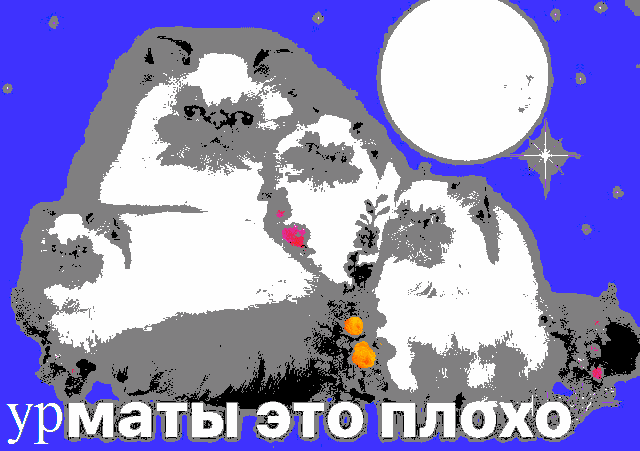

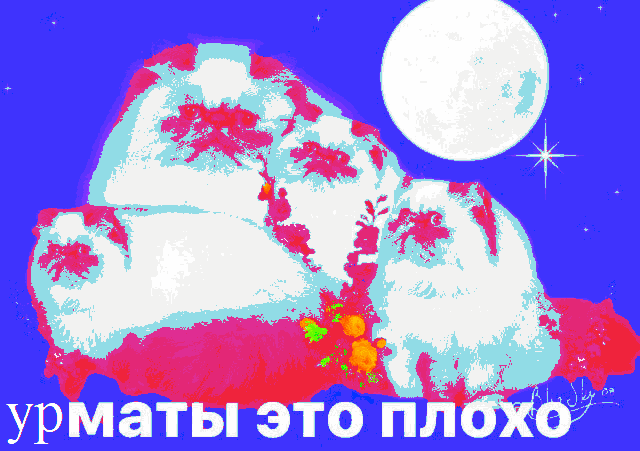

In [36]:
my_filter(my_read('flowers.jpeg'), kmeans_my, 'flowers my.jpeg')

In [37]:
my_filter(my_read('flowers.jpeg'), kmeans_my_wob, 'flowers my wob.jpeg')

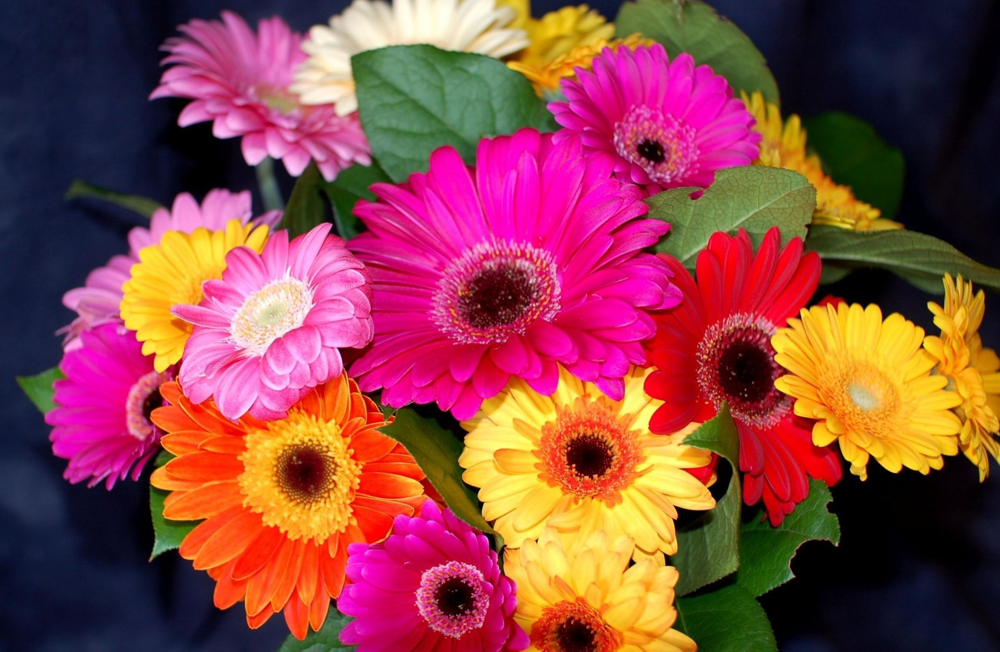
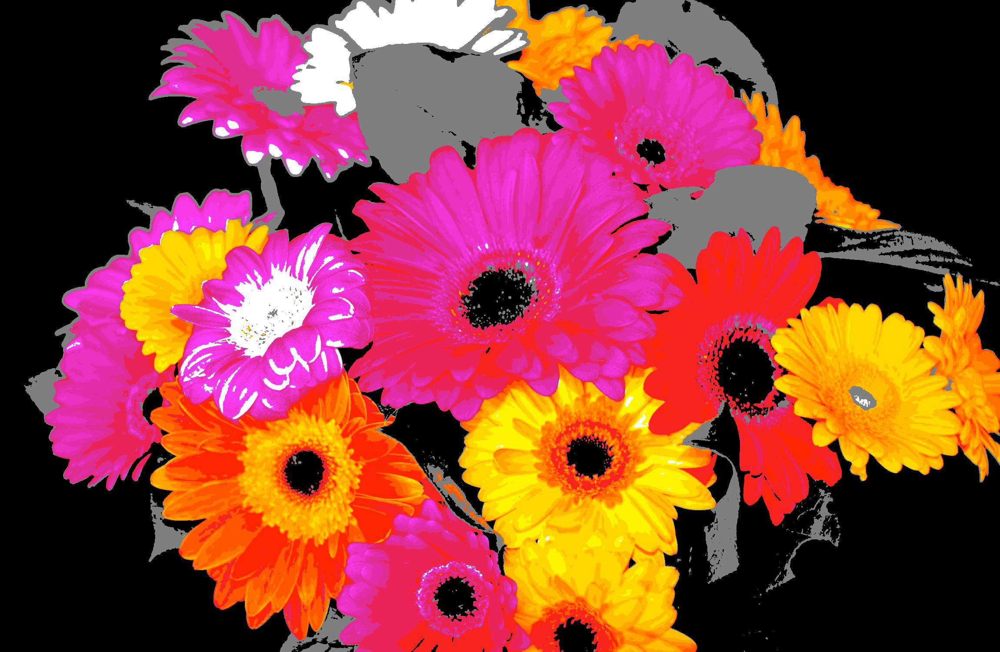
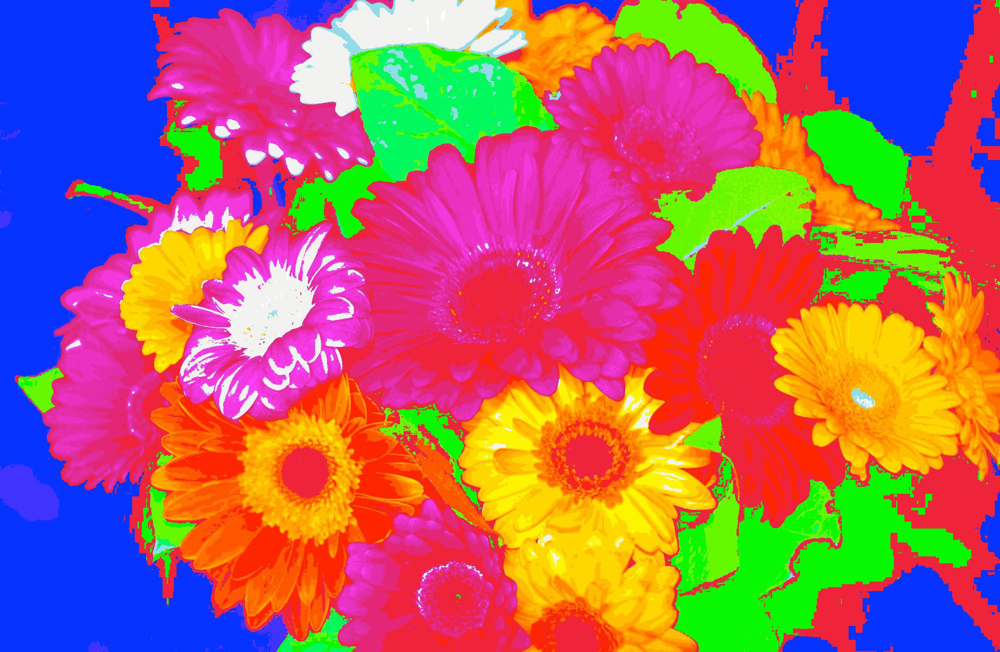

Что ж, темных цветов явно не хватает.

В общем и целом, рассмотренный метод способен уменьшать количество цветов в картинке не особо портя её качество (если оставлять 30 и более цветов - то разница минимальна). Но это всё справедливо, если изображение "естественное" - то есть не имеет очень резких переходов.  
Была сделана попытка создать модель моего зрения, но из-за слишком сильной дискретизации выборки и непредставленности в ней тёмных цветов, получилось не очень похоже. В дальнейшем я хочу всё же найти оптимальный метод построения модели по моему зрению.